# **Object Detection using YOLO Model - Construction Safety Dataset**
## Capstone AI Engineering Project Module 4 | By: Kemal Aditya Permana

**Tujuan:** Membangun model object detection untuk mengenali kelengkapan Alat Pelindung Diri (APD) pekerja konstruksi dari sebuah foto, lalu menghitung berapa pekerja yang sudah lengkap dan berapa yang belum, sebelum model di-export untuk dipakai di aplikasi Streamlit.


## Algoritma Model Object Detection

Pada project ini dibandingkan dua arsitektur: **YOLOv8n** dan **YOLOv12s**. Keduanya dilatih di atas dataset yang sama untuk melihat apakah berpindah ke arsitektur yang lebih baru (attention-based) benar-benar membantu mengenali kelas lebih baik atau tidak. Berikut perbandingan dari masing-masing arsitektur

| Model | Parameter | Tipe Arsitektur | Penjelasan Singkat |
| --- | --- | --- | --- |
| **YOLOv8n** ("nano") | ~3.0M | CNN murni (convolutional) | Varian paling kecil di keluarga YOLOv8. Dioptimalkan untuk kecepatan dan efisiensi memori, bukan akurasi mentah. Biasanya dipilih untuk inference cepat di perangkat dengan resource terbatas, dengan konsekuensi kapasitas belajar yang lebih rendah. |
| **YOLOv12s** ("small") | ~9.2M | CNN + attention mechanism | Generasi arsitektur yang lebih baru. Berbeda dari YOLOv8 yang murni CNN, YOLOv12 menambahkan mekanisme **attention** (terinspirasi dari arsitektur transformer) di detection head-nya. Attention membuat model bisa "menimbang" bagian gambar mana yang lebih penting untuk suatu prediksi, alih-alih memperlakukan semua area secara sama rata. |


## Konfigurasi Dataset & Mount Google Drive

- Dataset berformat YOLO (train/valid/test), sudah dianotasi lewat Roboflow.
- 5 kelas: `person`, `helmet`, `no-helmet`, `vest`, `no-vest`.



In [1]:

class_names = [
    "helmet",
    "no-helmet",
    "no-vest",
    "person",
    "vest"
]

print(class_names)

['helmet', 'no-helmet', 'no-vest', 'person', 'vest']


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 1) Cek Environment & GPU

Pada bagian ini mencoba untuk melakukan pengecekan GPU di Google Colab dan menampilkan GPU yang digunakan

In [3]:
!nvidia-smi # Pengecekan GPU di Google Colab

import torch
import cv2
import matplotlib.pyplot as plt
from pathlib import Path

print("PyTorch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))


Sun Sep 13 22:51:44 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   39C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## 2) Instalasi Dependencies

Pada bagian ini melakukan instalasi terhadap library yang dibutuhkan dalam proses pembuatan algoritma Object Detection

In [4]:

!pip install -qU ultralytics supervision albumentations opencv-python-headless matplotlib seaborn pycocotools

import ultralytics, supervision, albumentations, cv2, matplotlib
print('ultralytics', ultralytics.__version__)
print('supervision', supervision.__version__)
print('albumentations', albumentations.__version__)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.6/46.6 kB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.3/80.3 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.2/88.2 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 45.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 377.1/377.1 kB 38.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 81.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.8/35.8 MB 18.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.3/144.3 kB 9.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.8/75.8 kB 8.3 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/usage/setti

## 3) Eksplorasi Dataset (EDA)

Pada bagian ini mencoba
Script ini menelusuri struktur folder dataset, mendeteksi format anotasi, menghitung jumlah instance per kelas, mengecek gambar yang tidak punya file label, dan menggambar beberapa sample bounding box untuk quality check manual.


Scanning: /content/drive/MyDrive/Purwadhika_Capstone4_Dataset/construction safety.v1i.yolov12

  test/  (2 items)
  test/images/  (90 items)
  test/labels/  (90 items)
  train/  (2 items)
  train/images/  (997 items)
  train/labels/  (997 items)
  valid/  (2 items)
  valid/images/  (119 items)
  valid/labels/  (119 items)

Detected annotation format: yolo
Found class list at: /content/drive/MyDrive/Purwadhika_Capstone4_Dataset/construction safety.v1i.yolov12/data.yaml
Classes: ['helmet', 'no-helmet', 'no-vest', 'person', 'vest']

Image/label count per split:
  train  images= 997  labels= 997  images_without_label_file=0
  valid  images= 119  labels= 119  images_without_label_file=0
  test   images=  90  labels=  90  images_without_label_file=0

No missing-label images to check.

Label files found: 1206
Instance count per class:
  person          2817
  helmet          2543
  vest            1343
  no-vest         892
  no-helmet       129

Saved visual check to sample_annotations_previ

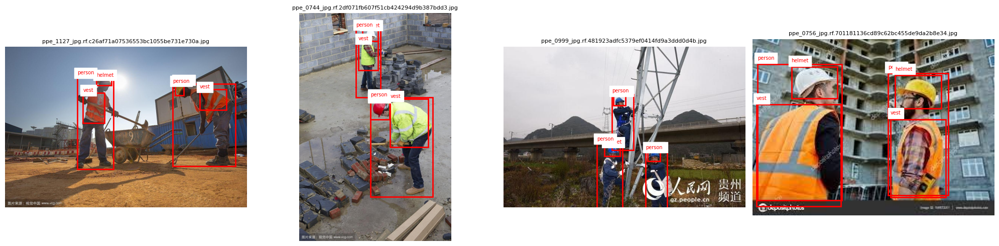

In [5]:
import os
import json
import random
from pathlib import Path
from collections import Counter

import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

# Arahkan ke folder dataset yang sudah di-unzip
DATASET_ROOT = "/content/drive/MyDrive/Purwadhika_Capstone4_Dataset/construction safety.v1i.yolov12"

EXPECTED_CLASSES = ["person", "helmet", "vest", "no-helmet", "no-vest"]


def find_structure(root):
    root = Path(root)
    print(f"Scanning: {root.resolve()}\n")
    for sub in sorted(root.rglob("*")):
        if sub.is_dir():
            n_files = len(list(sub.glob("*")))
            print(f"  {sub.relative_to(root)}/  ({n_files} items)")


def detect_format(root):
    root = Path(root)
    has_txt = any(root.rglob("*.txt"))
    has_coco_json = any(
        f.name.lower() in ("_annotations.coco.json", "annotations.json")
        or "coco" in f.name.lower()
        for f in root.rglob("*.json")
    )
    if has_coco_json:
        return "coco"
    if has_txt:
        return "yolo"
    return "unknown"


def load_yolo_class_names(root):
    root = Path(root)
    for candidate in ["data.yaml", "dataset.yaml"]:
        matches = list(root.rglob(candidate))
        if matches:
            path = matches[0]
            print(f"Found class list at: {path}")
            text = path.read_text()
            try:
                import yaml
                data = yaml.safe_load(text)
                names = data.get("names")
                if isinstance(names, dict):
                    return [names[i] for i in sorted(names)]
                if isinstance(names, list):
                    return names
            except Exception as e:
                print(f"  (yaml parse failed: {e}, trying regex fallback)")
            # Fallback untuk gaya penulisan Roboflow (satu baris):
            # names: ['no-helmet', 'no-vest', 'helmet', 'person', 'vest']
            import re, ast
            match = re.search(r"names:\s*(\[[^\]]*\])", text)
            if match:
                try:
                    return ast.literal_eval(match.group(1))
                except Exception:
                    pass
    matches = list(root.rglob("classes.txt"))
    if matches:
        return [l.strip() for l in matches[0].read_text().splitlines() if l.strip()]
    print("No data.yaml/classes.txt found — falling back to EXPECTED_CLASSES order.")
    print("Double check this matches your label files' class-index order!")
    return EXPECTED_CLASSES


def count_yolo_classes(root, class_names):
    root = Path(root)
    # Hanya scan .txt yang ada di dalam folder "labels", supaya tidak ikut
    # membaca README.roboflow.txt / README.dataset.txt di root dataset.
    label_files = [
        f for f in root.rglob("*.txt")
        if f.parent.name == "labels" and f.name != "classes.txt"
    ]
    counts = Counter()
    for lf in label_files:
        for line in lf.read_text().splitlines():
            if not line.strip():
                continue
            cls_idx = int(line.split()[0])
            name = class_names[cls_idx] if cls_idx < len(class_names) else f"class_{cls_idx}"
            counts[name] += 1
    print(f"\nLabel files found: {len(label_files)}")
    print("Instance count per class:")
    for name, c in counts.most_common():
        print(f"  {name:15s} {c}")
    return counts, label_files


def check_image_label_mismatch(root):
    root = Path(root)
    print("\nImage/label count per split:")
    missing_by_split = {}
    for split in ["train", "valid", "test"]:
        img_dir = root / split / "images"
        lbl_dir = root / split / "labels"
        if not img_dir.exists():
            continue
        img_stems = {p.stem: p for p in img_dir.glob("*") if p.is_file()}
        lbl_stems = {p.stem for p in lbl_dir.glob("*.txt")} if lbl_dir.exists() else set()
        missing = set(img_stems) - lbl_stems
        missing_by_split[split] = [img_stems[s] for s in missing]
        print(f"  {split:6s} images={len(img_stems):4d}  labels={len(lbl_stems):4d}  "
              f"images_without_label_file={len(missing)}")
        if missing and len(missing) <= 5:
            print(f"    e.g. missing labels for: {sorted(missing)}")
    return missing_by_split


def visualize_missing_label_images(missing_by_split, n=6):
    # Cek sample gambar tanpa label — pastikan ini memang background negatif,
    # bukan hasil export yang rusak.
    all_missing = [p for imgs in missing_by_split.values() for p in imgs]
    if not all_missing:
        print("\nNo missing-label images to check.")
        return
    sample = random.sample(all_missing, min(n, len(all_missing)))
    fig, axes = plt.subplots(1, len(sample), figsize=(4 * len(sample), 4))
    if len(sample) == 1:
        axes = [axes]
    for ax, img_path in zip(axes, sample):
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(img_path.name, fontsize=7)
        ax.axis("off")
    plt.tight_layout()
    plt.savefig("missing_label_images_preview.png", dpi=150)
    print(f"\nSaved {len(sample)} missing-label sample images to missing_label_images_preview.png")


def count_coco_classes(root):
    root = Path(root)
    json_files = [f for f in root.rglob("*.json")]
    counts = Counter()
    for jf in json_files:
        data = json.loads(jf.read_text())
        id_to_name = {c["id"]: c["name"] for c in data.get("categories", [])}
        for ann in data.get("annotations", []):
            counts[id_to_name.get(ann["category_id"], "unknown")] += 1
    print("\nInstance count per class (COCO):")
    for name, c in counts.most_common():
        print(f"  {name:15s} {c}")
    return counts


def visualize_yolo_samples(root, class_names, label_files, n=4):
    root = Path(root)
    sample_labels = random.sample(label_files, min(n, len(label_files)))
    fig, axes = plt.subplots(1, len(sample_labels), figsize=(5 * len(sample_labels), 5))
    if len(sample_labels) == 1:
        axes = [axes]

    for ax, label_path in zip(axes, sample_labels):
        # gambar biasanya ada di folder "images" yang sejajar, nama file sama
        img_dir = Path(str(label_path.parent).replace("labels", "images"))
        img_path = None
        for ext in (".jpg", ".jpeg", ".png"):
            candidate = img_dir / (label_path.stem + ext)
            if candidate.exists():
                img_path = candidate
                break
        if img_path is None:
            continue

        img = Image.open(img_path)
        w, h = img.size
        ax.imshow(img)
        ax.set_title(img_path.name, fontsize=8)
        ax.axis("off")

        for line in label_path.read_text().splitlines():
            if not line.strip():
                continue
            cls_idx, xc, yc, bw, bh = map(float, line.split())
            cls_idx = int(cls_idx)
            name = class_names[cls_idx] if cls_idx < len(class_names) else str(cls_idx)
            # Format YOLO: center-x, center-y, width, height (semua ternormalisasi)
            x0 = (xc - bw / 2) * w
            y0 = (yc - bh / 2) * h
            rect = patches.Rectangle(
                (x0, y0), bw * w, bh * h, linewidth=2, edgecolor="red", facecolor="none"
            )
            ax.add_patch(rect)
            ax.text(x0, y0 - 5, name, color="red", fontsize=7, backgroundcolor="white")

    plt.tight_layout()
    plt.savefig("sample_annotations_preview.png", dpi=150)
    print("\nSaved visual check to sample_annotations_preview.png")


if __name__ == "__main__":
    find_structure(DATASET_ROOT)
    fmt = detect_format(DATASET_ROOT)
    print(f"\nDetected annotation format: {fmt}")

    if fmt == "yolo":
        class_names = load_yolo_class_names(DATASET_ROOT)
        print(f"Classes: {class_names}")
        missing_by_split = check_image_label_mismatch(DATASET_ROOT)
        visualize_missing_label_images(missing_by_split)
        counts, label_files = count_yolo_classes(DATASET_ROOT, class_names)
        visualize_yolo_samples(DATASET_ROOT, class_names, label_files)
    elif fmt == "coco":
        count_coco_classes(DATASET_ROOT)
    else:
        print("Could not auto-detect format — open a few files manually to check.")


Notes:
- Kelas `no-helmet` jauh lebih sedikit dibanding kelas lain (class imbalance) — ini yang mendasari langkah augmentasi di bagian persiapan dataset.

## 4) Persiapan & Balancing Dataset (Augmentasi Non-Geometris)

Langkah ini membuat folder `prepared/` yang berisi:
1. Hanya gambar yang punya file label
2. Copy tambahan (augmented) untuk kelas langka (`no-helmet`, `no-vest`) memakai transformasi **non-geometris** saja (brightness/contrast/noise/blur)
3. `data.yaml` baru yang menunjuk ke folder `prepared/`.

Augmentasi hanya diterapkan ke split data **train** — data valid/test tetap bersih sebagai tolak ukur performa asli.


In [6]:
import shutil
import random
from pathlib import Path
from collections import Counter

import cv2
import yaml
import albumentations as A

# ---- CONFIG ----
DATASET_ROOT = "/content/drive/MyDrive/Purwadhika_Capstone4_Dataset/construction safety.v1i.yolov12"
OUTPUT_ROOT = None  # default: DATASET_ROOT/prepared

# Kelas yang di-oversample lewat augmentasi, dan berapa banyak copy tambahan per gambar
RARE_CLASS_MULTIPLIERS = {
    "no-helmet": 6,   # hanya 129 instance -> paling perlu dibantu
    "no-vest": 2,     # 892 instance, agak kurang -> dibantu sedikit
}

random.seed(42)

# Augmentasi non-geometris — aman untuk object detection karena posisi pixel
# tidak berubah, hanya nilainya (brightness, noise, warna, blur).
augment = A.Compose([
    A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3, p=0.9),
    A.GaussNoise(var_limit=(10.0, 50.0), p=0.4),
    A.HueSaturationValue(hue_shift_limit=10, sat_shift_limit=20, val_shift_limit=10, p=0.5),
    A.OneOf([
        A.GaussianBlur(blur_limit=(3, 5), p=1.0),
        A.MotionBlur(blur_limit=(3, 5), p=1.0),
    ], p=0.3),
    A.CLAHE(p=0.2),
])


def load_class_names(root):
    with open(root / "data.yaml") as f:
        data = yaml.safe_load(f)
    names = data["names"]
    return names if isinstance(names, list) else [names[i] for i in sorted(names)]


def copy_clean_split(root, out_root, split, class_names, rare_indices):
    """Copy gambar yang punya file label saja. Return dict kelas langka ->
    list (image_path, label_path) untuk split ini."""
    img_dir = root / split / "images"
    lbl_dir = root / split / "labels"
    out_img_dir = out_root / split / "images"
    out_lbl_dir = out_root / split / "labels"
    out_img_dir.mkdir(parents=True, exist_ok=True)
    out_lbl_dir.mkdir(parents=True, exist_ok=True)

    rare_images = {name: [] for name in rare_indices}
    kept, dropped = 0, 0

    for img_path in img_dir.glob("*"):
        if not img_path.is_file():
            continue
        lbl_path = lbl_dir / (img_path.stem + ".txt")
        if not lbl_path.exists():
            dropped += 1
            continue
        shutil.copy2(img_path, out_img_dir / img_path.name)
        shutil.copy2(lbl_path, out_lbl_dir / lbl_path.name)
        kept += 1

        lines = lbl_path.read_text().splitlines()
        classes_here = {int(l.split()[0]) for l in lines if l.strip()}
        for name, idx in rare_indices.items():
            if idx in classes_here:
                rare_images[name].append((out_img_dir / img_path.name, out_lbl_dir / lbl_path.name))

    print(f"  {split}: kept {kept}, dropped {dropped} (no label file)")
    return rare_images


def augment_rare_images(rare_images, multiplier, out_img_dir, out_lbl_dir):
    """Membuat `multiplier` copy augmented per gambar yang punya kelas langka.
    Label di-copy apa adanya, tidak ikut berubah."""
    created = 0
    for img_path, lbl_path in rare_images:
        img = cv2.imread(str(img_path))
        for i in range(multiplier):
            aug = augment(image=img)["image"]
            new_stem = f"{img_path.stem}_aug{i}"
            out_img_path = out_img_dir / f"{new_stem}{img_path.suffix}"
            out_lbl_path = out_lbl_dir / f"{new_stem}.txt"
            cv2.imwrite(str(out_img_path), aug)
            shutil.copy2(lbl_path, out_lbl_path)
            created += 1
    return created


def count_classes(out_root, split, class_names):
    lbl_dir = out_root / split / "labels"
    counts = Counter()
    for lbl_path in lbl_dir.glob("*.txt"):
        for line in lbl_path.read_text().splitlines():
            if line.strip():
                idx = int(line.split()[0])
                counts[class_names[idx]] += 1
    return counts


def save_augmentation_sample(rare_images_by_split, out_root, n_samples=5):
    """Simpan preview before/after augmentasi untuk beberapa gambar contoh,
    supaya bisa dicek visual sebelum augmentasi penuh dijalankan."""
    sample_dir = out_root / "aug_preview"
    sample_dir.mkdir(parents=True, exist_ok=True)

    # Kumpulkan semua (img_path, lbl_path) dari kelas langka di train, lalu ambil n_samples
    all_pairs = []
    for pairs in rare_images_by_split["train"].values():
        all_pairs.extend(pairs)

    if not all_pairs:
        print("  No rare-class images found for preview.")
        return

    sample = random.sample(all_pairs, min(n_samples, len(all_pairs)))

    for i, (img_path, _) in enumerate(sample):
        img = cv2.imread(str(img_path))
        aug = augment(image=img)["image"]

        # Simpan berdampingan: original | augmented
        combined = cv2.hconcat([img, aug])
        out_path = sample_dir / f"sample{i}_{img_path.stem}.jpg"
        cv2.imwrite(str(out_path), combined)

    print(f"  Saved {len(sample)} before/after samples to {sample_dir}")

def main():
    root = Path(DATASET_ROOT)
    out_root = Path(OUTPUT_ROOT) if OUTPUT_ROOT else root / "prepared"

    class_names = load_class_names(root)
    rare_indices = {name: class_names.index(name) for name in RARE_CLASS_MULTIPLIERS if name in class_names}
    print(f"Classes: {class_names}")
    print(f"Rare classes to boost: {rare_indices}\n")

    print("Copying clean (properly labeled) images per split...")
    rare_images_by_split = {}
    for split in ["train", "valid", "test"]:
        rare_images_by_split[split] = copy_clean_split(root, out_root, split, class_names, rare_indices)

    print("\nBefore augmentation, train class counts:")
    before = count_classes(out_root, "train", class_names)
    for name, c in before.most_common():
        print(f"  {name:15s} {c}")

    # Preview 5 sample augmentasi dulu sebelum dijalankan ke semua gambar
    print("\nSaving augmentation preview samples...")
    save_augmentation_sample(rare_images_by_split, out_root, n_samples=5)

    # Augmentasi hanya untuk split data TRAIN — data valid/test tidak boleh disentuh,
    # karena keduanya jadi tolak ukur performa yang harus tetap asli.
    print("\nGenerating non-geometric augmentations for rare classes (train only)...")
    out_img_dir = out_root / "train" / "images"
    out_lbl_dir = out_root / "train" / "labels"
    for name, multiplier in RARE_CLASS_MULTIPLIERS.items():
        if name not in rare_images_by_split["train"]:
            continue
        imgs = rare_images_by_split["train"][name]
        n_created = augment_rare_images(imgs, multiplier, out_img_dir, out_lbl_dir)
        print(f"  {name}: augmented {len(imgs)} source images x{multiplier} -> {n_created} new images")

    print("\nAfter augmentation, train class counts:")
    after = count_classes(out_root, "train", class_names)
    for name, c in after.most_common():
        print(f"  {name:15s} {c}  (was {before.get(name, 0)})")

    # Simpan data.yaml baru di folder "prepared"
    new_yaml = {
        "train": str((out_root / "train" / "images").resolve()),
        "val": str((out_root / "valid" / "images").resolve()),
        "test": str((out_root / "test" / "images").resolve()),
        "nc": len(class_names),
        "names": class_names,
    }
    with open(out_root / "data.yaml", "w") as f:
        yaml.dump(new_yaml, f)
    print(f"\nWrote {out_root / 'data.yaml'} — use this path when training in next step.")

if __name__ == "__main__":
    main()


/tmp/ipykernel_6605/2488706392.py:26: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10.0, 50.0), p=0.4),


Classes: ['helmet', 'no-helmet', 'no-vest', 'person', 'vest']
Rare classes to boost: {'no-helmet': 1, 'no-vest': 2}

Copying clean (properly labeled) images per split...
  train: kept 997, dropped 0 (no label file)
  valid: kept 119, dropped 0 (no label file)
  test: kept 90, dropped 0 (no label file)

Before augmentation, train class counts:
  person          2362
  helmet          2116
  vest            1073
  no-vest         741
  no-helmet       94

Saving augmentation preview samples...
  Saved 5 before/after samples to /content/drive/MyDrive/Purwadhika_Capstone4_Dataset/construction safety.v1i.yolov12/prepared/aug_preview

Generating non-geometric augmentations for rare classes (train only)...
  no-helmet: augmented 49 source images x6 -> 294 new images
  no-vest: augmented 390 source images x2 -> 780 new images

After augmentation, train class counts:
  person          5110  (was 2362)
  helmet          4298  (was 2116)
  no-vest         2607  (was 741)
  vest            1649  (

In [7]:
import random
import shutil
from pathlib import Path

OUTPUT_ROOT = "/content/drive/MyDrive/Purwadhika_Capstone4_Dataset/construction safety.v1i.yolov12/prepared"

out_root = Path(OUTPUT_ROOT)
out_img_dir = out_root / "train" / "images"
sample_dir = out_root / "aug_preview_after"

random.seed(42)  # opsional, biar hasil sample konsisten tiap dijalankan ulang


def save_augmentation_sample_after(out_img_dir, sample_dir, n_samples=5):
    """Ambil beberapa gambar hasil augmentasi (file dengan '_aug' di nama)
    dan copy ke folder preview, buat cek visual hasil akhirnya."""
    sample_dir.mkdir(parents=True, exist_ok=True)

    aug_files = [p for p in out_img_dir.glob("*_aug*") if p.is_file()]
    if not aug_files:
        print("  No augmented images found for preview.")
        return

    sample = random.sample(aug_files, min(n_samples, len(aug_files)))
    for img_path in sample:
        shutil.copy2(img_path, sample_dir / img_path.name)

    print(f"  Saved {len(sample)} post-augmentation samples to {sample_dir}")


save_augmentation_sample_after(out_img_dir, sample_dir, n_samples=5)

  Saved 5 post-augmentation samples to /content/drive/MyDrive/Purwadhika_Capstone4_Dataset/construction safety.v1i.yolov12/prepared/aug_preview_after


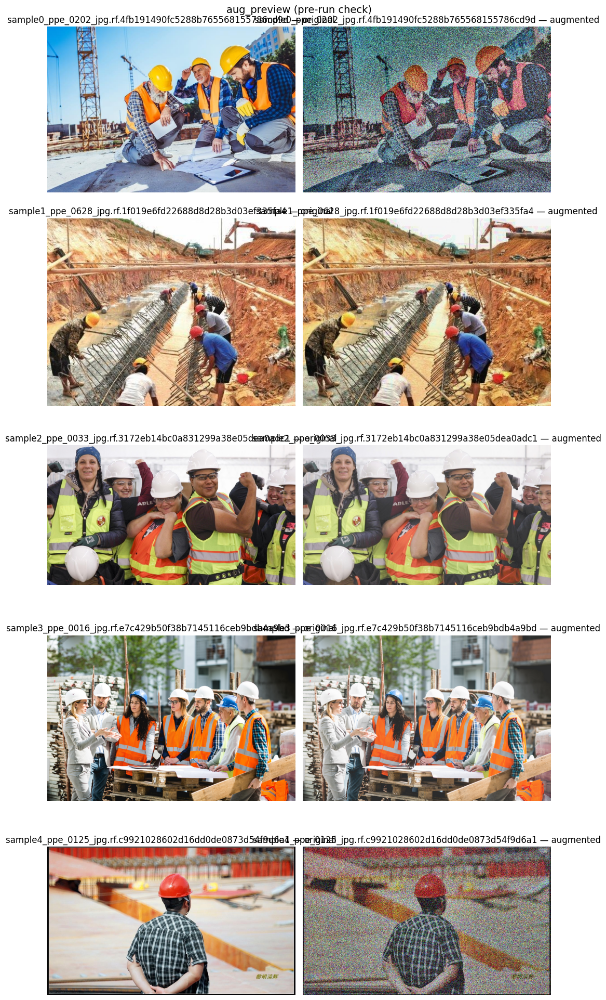

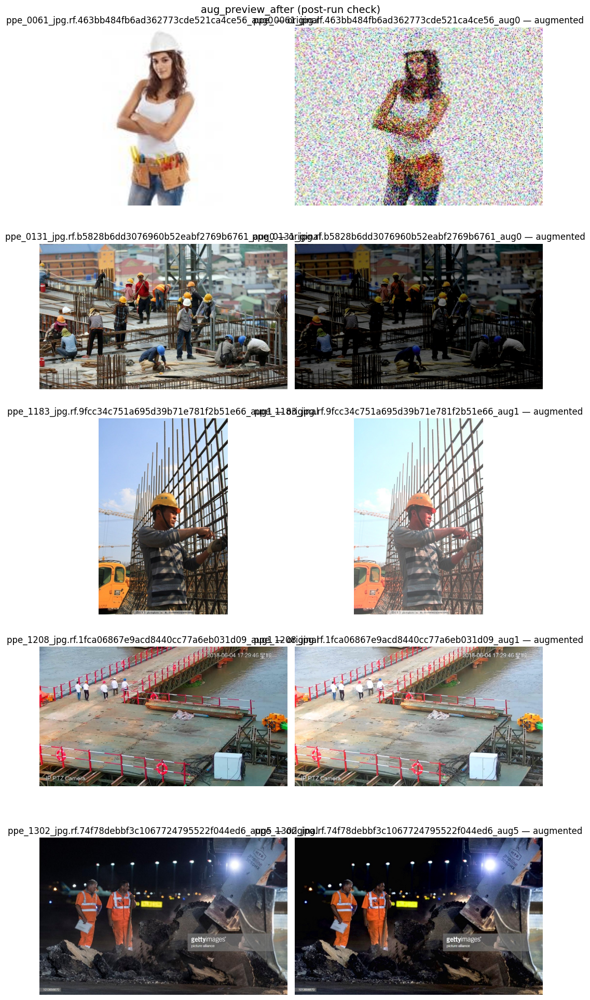

In [8]:
import re
import cv2
import matplotlib.pyplot as plt
from pathlib import Path

OUTPUT_ROOT = "/content/drive/MyDrive/Purwadhika_Capstone4_Dataset/construction safety.v1i.yolov12/prepared"
out_root = Path(OUTPUT_ROOT)

preview_dir = out_root / "aug_preview"
preview_after_dir = out_root / "aug_preview_after"
train_img_dir = out_root / "train" / "images"


def show_pairs(rgb_pairs, title):
    n = len(rgb_pairs)
    fig, axes = plt.subplots(n, 2, figsize=(10, 4 * n))
    if n == 1:
        axes = [axes]
    fig.suptitle(title, fontsize=14)
    for row, (name, before_rgb, after_rgb) in zip(axes, rgb_pairs):
        row[0].imshow(before_rgb)
        row[0].set_title(f"{name} — original")
        row[0].axis("off")
        row[1].imshow(after_rgb)
        row[1].set_title(f"{name} — augmented")
        row[1].axis("off")
    plt.tight_layout()
    plt.show()


# ---- 1. aug_preview: already saved as one hconcat'd image (left=original, right=augmented) ----
combined_files = sorted(preview_dir.glob("*.jpg"))
pairs_1 = []
for img_path in combined_files:
    combined = cv2.imread(str(img_path))
    h, w = combined.shape[:2]
    before = cv2.cvtColor(combined[:, : w // 2], cv2.COLOR_BGR2RGB)
    after = cv2.cvtColor(combined[:, w // 2 :], cv2.COLOR_BGR2RGB)
    pairs_1.append((img_path.stem, before, after))

if pairs_1:
    show_pairs(pairs_1, "aug_preview (pre-run check)")
else:
    print("No files found in aug_preview.")


# ---- 2. aug_preview_after: only the augmented copy was saved — look up its original ----
aug_files = sorted(preview_after_dir.glob("*_aug*"))
pairs_2 = []
for img_path in aug_files:
    # strip the "_augN" suffix to recover the original filename, e.g. "foo_aug0.jpg" -> "foo.jpg"
    orig_stem = re.sub(r"_aug\d+$", "", img_path.stem)
    orig_path = train_img_dir / f"{orig_stem}{img_path.suffix}"
    if not orig_path.exists():
        print(f"  Original not found for {img_path.name}, skipping")
        continue
    before = cv2.cvtColor(cv2.imread(str(orig_path)), cv2.COLOR_BGR2RGB)
    after = cv2.cvtColor(cv2.imread(str(img_path)), cv2.COLOR_BGR2RGB)
    pairs_2.append((img_path.stem, before, after))

if pairs_2:
    show_pairs(pairs_2, "aug_preview_after (post-run check)")
else:
    print("No files found in aug_preview_after.")

## 5) Training Model — Perbandingan 2 Arsitektur

Semua augmentasi geometris (flip, rotate, scale, dst.) dimatikan secara eksplisit di parameter training. Dua arsitektur dilatih dengan setting yang identik supaya perbandingannya adil: **YOLOv8n** dan **YOLOv12s** (arsitektur berbasis attention, weight-nya di-download manual karena bukan bagian dari release resmi Ultralytics).


In [9]:
from ultralytics import YOLO

# ---- CONFIG ----
DATA_YAML = "/content/drive/MyDrive/Purwadhika_Capstone4_Dataset/construction safety.v1i.yolov12/prepared/data.yaml"
BASE_MODEL = "yolov8n.pt"   # n = nano: paling ringan & cepat, jadi baseline pembanding
EPOCHS = 100
IMG_SIZE = 640
BATCH = 16
PATIENCE = 20               # stop lebih awal kalau metrik val tidak menunjukkan improvement setelah sekian epoch
PROJECT_DIR = "ppe_detection_runs"
RUN_NAME = "yolov8n_ppe_v1"  # nama folder base model


def main():
    model = YOLO(BASE_MODEL)  # load pretrained weights, lalu fine-tune ke dataset kita

    results = model.train(
        data=DATA_YAML,
        epochs=EPOCHS,
        imgsz=IMG_SIZE,
        batch=BATCH,
        patience=PATIENCE,
        project=PROJECT_DIR,
        name=RUN_NAME,
        seed=42,
        # Matikan semua augmentasi geometris bawaan Ultralytics
        fliplr=0.0,
        flipud=0.0,
        degrees=0.0,
        translate=0.0,
        scale=0.0,
        shear=0.0,
        perspective=0.0,
        mosaic=0.0,     # mosaic menggabungkan 4 gambar dengan pergeseran geometris implisit
    )

    print("\nTraining complete. Best weights saved to:")
    print(f"  {PROJECT_DIR}/{RUN_NAME}/weights/best.pt")

    # Validasi + metrik per kelas — ini yang menentukan apakah oversampling no-helmet berhasil
    print("\nRunning validation for per-class metrics...")
    metrics = model.val(data=DATA_YAML)
    print("\nPer-class mAP50:")
    for i, name in enumerate(metrics.names.values()):
        try:
            print(f"  {name:15s} {metrics.box.ap50[i]:.3f}")
        except (IndexError, AttributeError):
            pass
    print(f"\nOverall mAP50: {metrics.box.map50:.3f}")
    print(f"Overall mAP50-95: {metrics.box.map:.3f}")


if __name__ == "__main__":
    main()


Ultralytics 8.4.150 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/Purwadhika_Capstone4_Dataset/construction safety.v1i.yolov12/prepared/data.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.0, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=

In [10]:
# Download manual — yolov12 bukan bagian dari release resmi Ultralytics,
!wget https://github.com/sunsmarterjie/yolov12/releases/download/v1.0/yolov12s.pt


--2026-09-13 23:26:44--  https://github.com/sunsmarterjie/yolov12/releases/download/v1.0/yolov12s.pt
Resolving github.com (github.com)... 140.82.113.3
Connecting to github.com (github.com)|140.82.113.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://release-assets.githubusercontent.com/github-production-release-asset/928546208/51dab1b7-a0d9-48df-8934-2191dca6d608?sp=r&sv=2018-11-09&sr=b&spr=https&se=2026-09-14T00%3A03%3A19Z&rscd=attachment%3B+filename%3Dyolov12s.pt&rsct=application%2Foctet-stream&skoid=96c2d410-5711-43a1-aedd-ab1947aa7ab0&sktid=398a6654-997b-47e9-b12b-9515b896b4de&skt=2026-09-13T23%3A03%3A13Z&ske=2026-09-14T00%3A03%3A19Z&sks=b&skv=2018-11-09&sig=OA7oDm8wAIeGEBX2CxlHWobDFAIrRWtxtufON5Tjtbo%3D&jwt=eyJ0eXAiOiJKV1QiLCJhbGciOiJIUzI1NiJ9.eyJpc3MiOiJnaXRodWIuY29tIiwiYXVkIjoicmVsZWFzZS1hc3NldHMuZ2l0aHVidXNlcmNvbnRlbnQuY29tIiwia2V5Ijoia2V5MSIsImV4cCI6MTc4OTM0MzgwNCwibmJmIjoxNzg5MzQyMDA0LCJwYXRoIjoicmVsZWFzZWFzc2V0cHJvZHVjdGlvbi5ibG9iLmNvcm

In [11]:
from ultralytics import YOLO

# ---- CONFIG ----
DATA_YAML = "/content/drive/MyDrive/Purwadhika_Capstone4_Dataset/construction safety.v1i.yolov12/prepared/data.yaml"
BASE_MODEL = "yolov12s.pt"  # arsitektur attention-centric, dibandingkan dengan 2 hasil yolov8 di atas
EPOCHS = 100
IMG_SIZE = 640
BATCH = 16
PATIENCE = 20              # stop lebih awal kalau metrik val tidak menunjukkan improvement setelah sekian epoch
PROJECT_DIR = "ppe_detection_runs"
RUN_NAME = "yolov12s_ppe_v1"  # nama beda supaya run v1 (yolov8n) dan v2 (yolov8s) tetap utuh


def main():
    model = YOLO(BASE_MODEL)  # load pretrained COCO weights, lalu fine-tune ke dataset kita

    results = model.train(
        data=DATA_YAML,
        epochs=EPOCHS,
        imgsz=IMG_SIZE,
        batch=BATCH,
        patience=PATIENCE,
        project=PROJECT_DIR,
        name=RUN_NAME,
        seed=42,
        # Matikan semua augmentasi geometris bawaan Ultralytics
        fliplr=0.0,
        flipud=0.0,
        degrees=0.0,
        translate=0.0,
        scale=0.0,
        shear=0.0,
        perspective=0.0,
        mosaic=0.0,     # mosaic menggabungkan 4 gambar dengan pergeseran geometris implisit
    )

    print("\nTraining complete. Best weights saved to:")
    print(f"  {PROJECT_DIR}/{RUN_NAME}/weights/best.pt")

    # Validasi + metrik per kelas — ini yang menentukan apakah oversampling no-helmet berhasil
    print("\nRunning validation for per-class metrics...")
    metrics = model.val(data=DATA_YAML)
    print("\nPer-class mAP50:")
    for i, name in enumerate(metrics.names.values()):
        try:
            print(f"  {name:15s} {metrics.box.ap50[i]:.3f}")
        except (IndexError, AttributeError):
            pass
    print(f"\nOverall mAP50: {metrics.box.map50:.3f}")
    print(f"Overall mAP50-95: {metrics.box.map:.3f}")


if __name__ == "__main__":
    main()


Ultralytics 8.4.150 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/Purwadhika_Capstone4_Dataset/construction safety.v1i.yolov12/prepared/data.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.0, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov12s.pt, momentum=0.937, mosaic


==================== yolov8n (v1) ====================


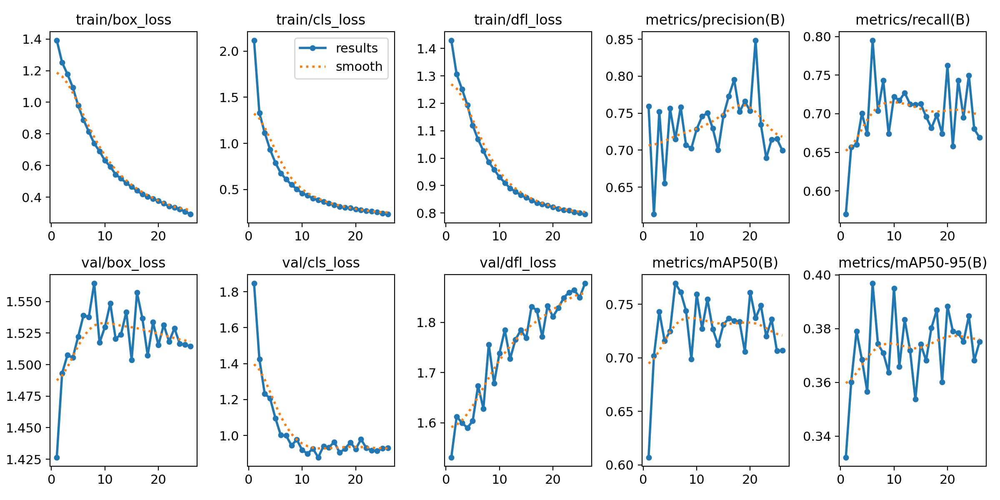

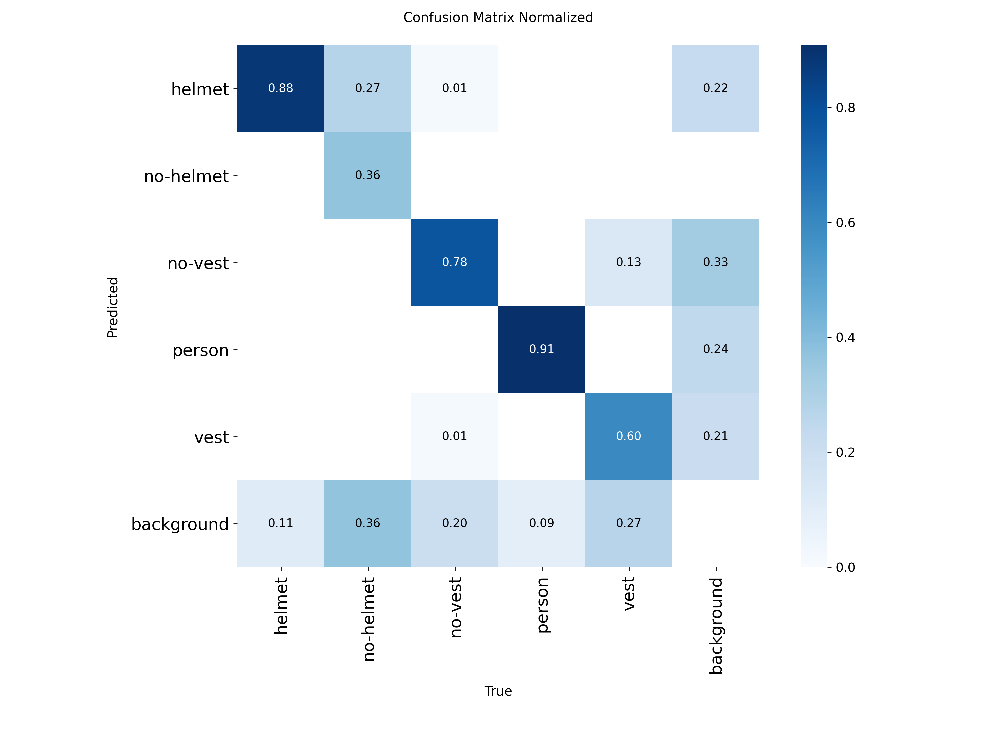

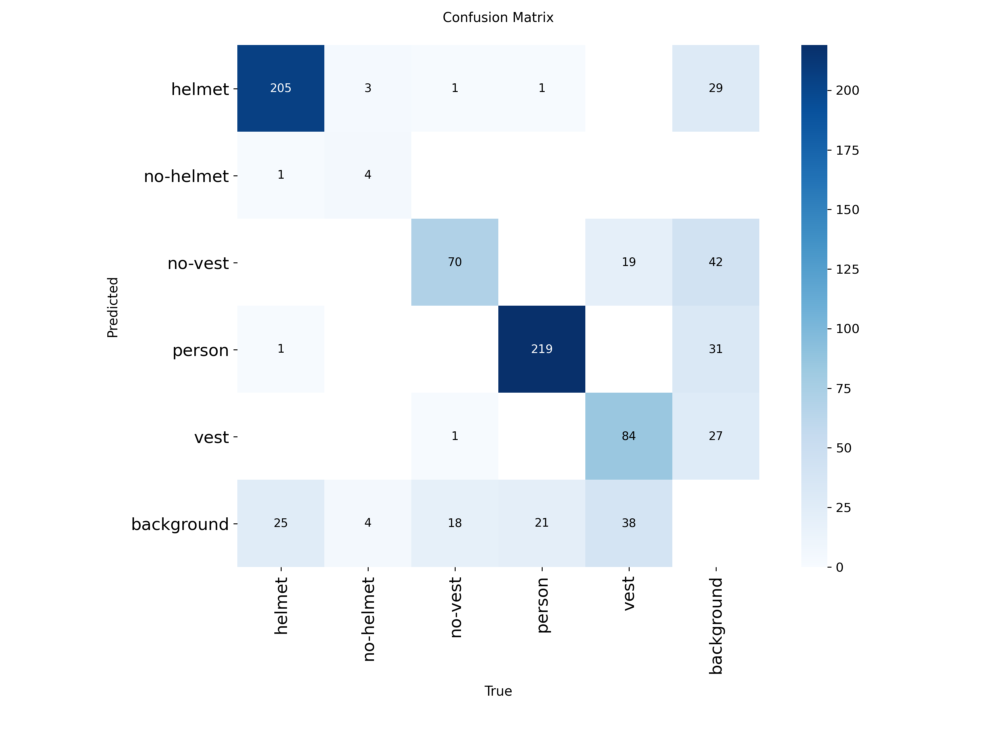


==================== yolov12s (v2) ====================


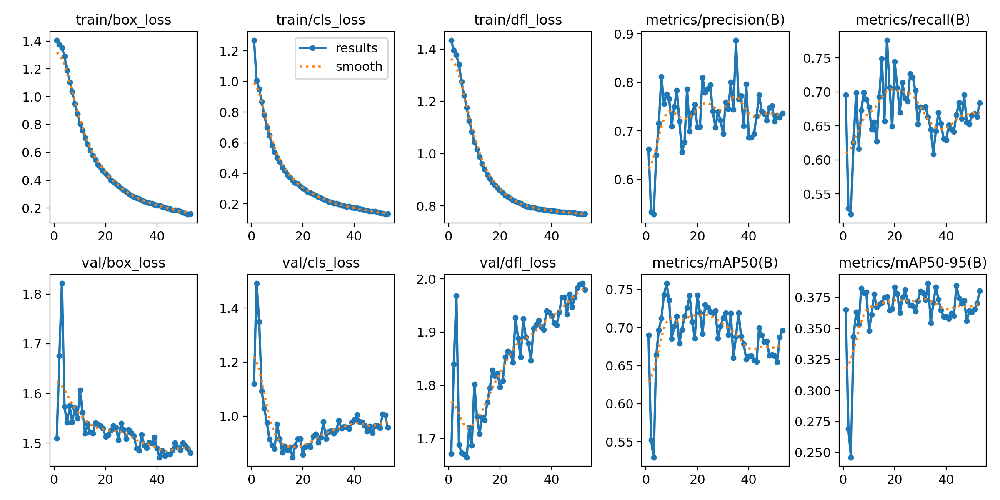

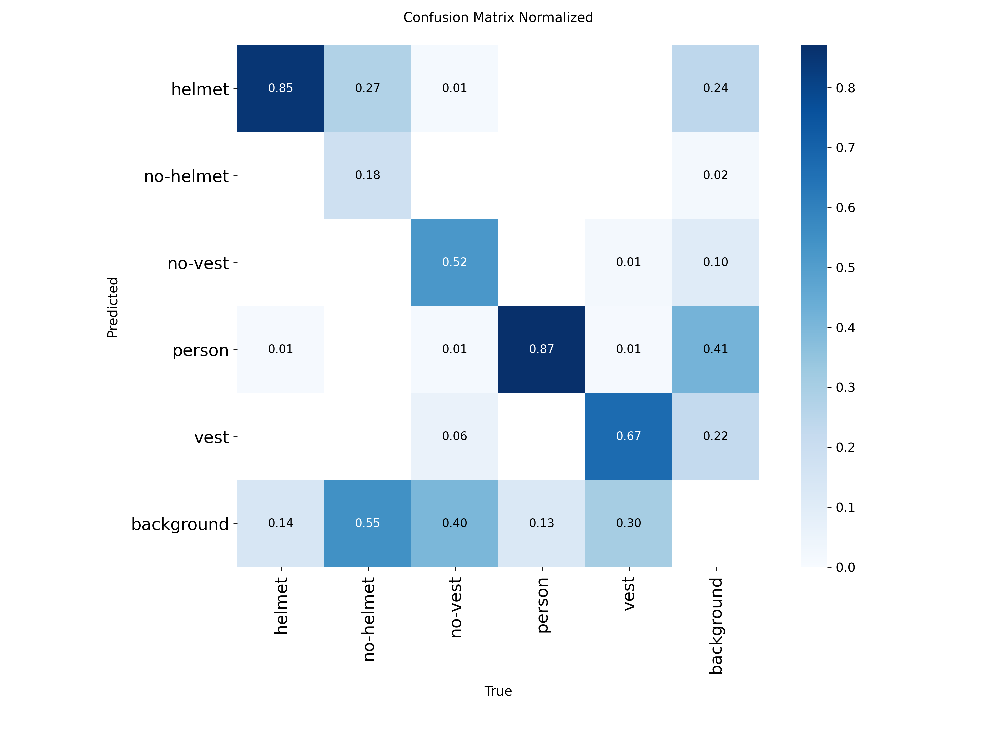

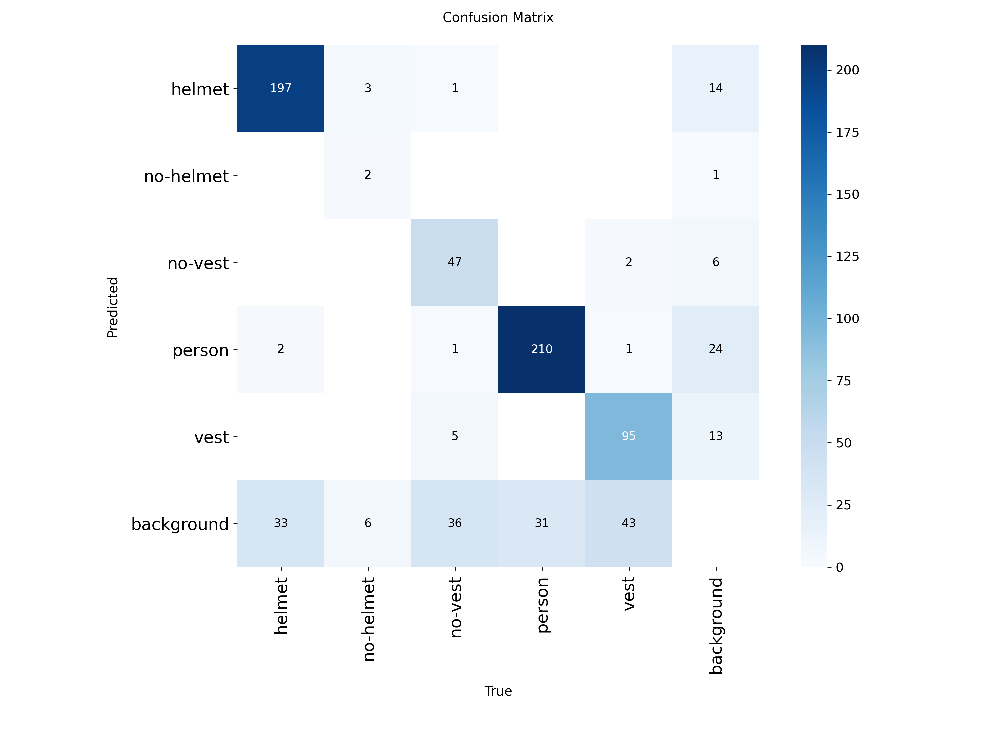

In [13]:
import os
from IPython.display import Image, display

RUNS_ROOT = "ppe_detection_runs"

RUN_NAMES = {
    "yolov8n (v1)": "/content/runs/detect/ppe_detection_runs/yolov8n_ppe_v1",
    "yolov12s (v2)": "/content/runs/detect/ppe_detection_runs/yolov12s_ppe_v1",
}

def show_run_visuals(run_name, label):
    run_dir = os.path.join(RUNS_ROOT, run_name)
    print(f"\n{'='*20} {label} {'='*20}")
    for fname in ["results.png", "confusion_matrix_normalized.png", "confusion_matrix.png"]:
        p = os.path.join(run_dir, fname)
        if os.path.exists(p):
            display(Image(p))
        else:
            print(f"  (missing: {fname})")

for label, run_name in RUN_NAMES.items():
    show_run_visuals(run_name, label)


# Perbandingan Model & Interpretasi mAP

Dua arsitektur dilatih di atas dataset *prepared* yang sama (2.011 gambar training + 119 gambar validasi) untuk melihat apakah menambah kapasitas model dan berpindah ke arsitektur berbasis attention (YOLOv12s) bisa mengatasi ketimpangan kelas `no-helmet` (kelas langka: hanya 11 instance di validasi, dibanding 232 untuk `helmet`).

| Model | Params | GFLOPs | Overall mAP50 | Overall mAP50-95 | no-helmet mAP50 | no-vest mAP50 |
|---|---|---|---|---|---|---|
| YOLOv12s | 9.2M | 23.5 | 0.733 | 0.389 | 0.440 | 0.638 |
| YOLOv8n | 3.0M | 8.2 | **0.776** | **0.395** | **0.583** | **0.704** |

mAP50 mengukur akurasi deteksi dengan threshold overlap yang longgar (box overlap 50% dianggap benar); mAP50-95 merata-ratakan ini di threshold yang lebih ketat (50-95%), sehingga lebih menghukum box yang kurang presisi. Kedua model punya mAP50-95 yang mirip (~0,39), artinya kualitas lokalisasi box-nya setara — perbedaan sebenarnya terlihat dari perilaku *klasifikasi* pada kelas-kelas langka.

YOLOv8n tidak hanya menang di mAP agregat — ia juga lebih baik di kelas yang paling berisiko, `no-helmet` (0,583 vs 0,440). Supaya keputusan tidak berhenti di mAP mentah, precision dan recall per-kelas dari validasi final dibedah lebih lanjut:

| Model | no-helmet Precision | no-helmet Recall |
|---|---|---|
| YOLOv12s | 0,744 | **0,273** |
| YOLOv8n | 0,858 | **0,549** |

Recall di sini yang paling krusial untuk aplikasi safety-monitoring: recall rendah berarti model sering *melewatkan* pekerja yang sebenarnya tidak memakai helm — kesalahan paling mahal, karena pekerja berisiko malah tidak terdeteksi sama sekali (bukan sekadar salah label, tapi tidak ter-flag). YOLOv12s hanya menangkap ~27% dari kasus `no-helmet` yang sebenarnya ada, sementara YOLOv8n menangkap ~55% — jauh lebih baik meski masih belum sempurna.

### **Kesimpulan**

1. **Class imbalance adalah tantangan utama**, bukan pemilihan arsitektur. Kedua model (YOLOv8n dan YOLOv12s) punya mAP50-95 yang mirip (~0,39–0,40), tapi berbeda jauh dalam cara mereka menangani kelas `no-helmet` yang datanya sedikit.
2. **mAP agregat saja tidak cukup untuk memilih model** pada kasus safety-monitoring — model dengan mAP tertinggi (YOLOv12s) justru punya tingkat kesalahan false-safe tertinggi untuk `no-helmet`, yaitu kesalahan paling mahal dalam konteks ini.
3. **Pipeline analisis kelengkapan APD** berhasil menerjemahkan deteksi box mentah menjadi keputusan per pekerja (lengkap / kurang APD / perlu dicek manual), sesuai use-case: bukan cuma deteksi objek, tapi menjawab "berapa pekerja yang belum lengkap alat keselamatannya".

### **Rekomendasi**

- **Tambah data untuk kelas `no-helmet`**, idealnya data asli baru, bukan hanya augmentasi dari gambar yang sudah ada — augmentasi non-geometris membantu tapi tetap dibatasi variasi dari gambar sumber yang sama.
- **Uji threshold overlap (0.5)** dengan nilai lain untuk melihat apakah assignment gear-ke-person bisa lebih akurat di foto yang ramai/crowded.

